# <center> <u>**Trouver les images (trop) similaires de Inaturalist avec des fonctions de hash** </u></center>




<div style="display: flex; justify-content: center;margin-top: 80px;margin-bottom: 10px;">
    <div style="text-align: center; margin-right: 20px;">
        <img src="../datafiles/images/173740578.jpg" alt="173740578.jpg" style="width: 500px;">
        <p style="font-weight: ;">173740578.jpg</p>
    </div>
    <div style="text-align: center; margin-left: 20px;">
        <img src="../datafiles/images/173740578.jpg" alt="173740578.jpg" style="width: 500px;">
        <p style="font-weight: ;">173740578.jpg</p>
    </div>
</div>


# Contexte


Beaucoup d'images sont très simimlaires dans le dataset de Inaturalist. 

Pour éviter de surcharger le modèle, de faire du sur-apprentissage, il est intéressant de les supprimer.

Néanmoins il faut faire attention à la manière de les supprimer : il peut être intéressant d'avoir des vues sous différents angles d'un même spécimen.

Pour cela, on va utiliser des fonctions de hash pour trouver les images similaires.


### Création d'un dossier avec des doublons pour tester

In [6]:
! mkdir ../../data_bees_detection/test_duplicates
! cp -r '../../data_bees_detection/whole_dataset/inaturalist_2305/Aglaoapis tridentata' '../../data_bees_detection/test_duplicates/'   

mkdir: cannot create directory ‘../../data_bees_detection/test_duplicates’: File exists


# 1. Comparaison de hash



## Test avec 3 images différents hash 64 bits  

In [9]:
! pip install imagehash

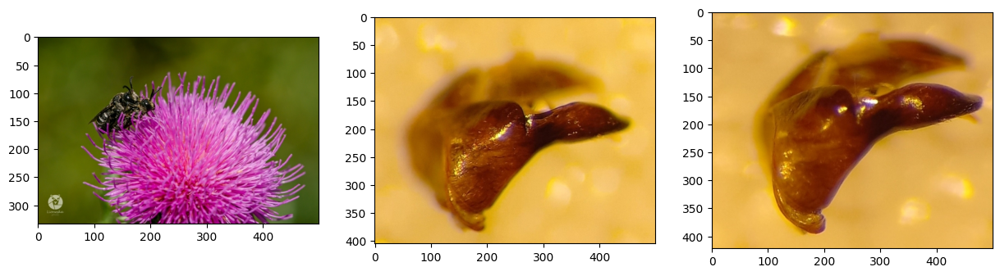

In [10]:
import os 
import matplotlib.pyplot as plt
from PIL import Image
import imagehash

base_path = '../../data_bees_detection/test_duplicates/'
path_1 = os.path.join(base_path,'82888774.jpg')
path_2 = os.path.join(base_path,'218427586.jpeg')
path_3 = os.path.join(base_path,'218427596.jpeg')

# display images in a row
fig, axs = plt.subplots(1, 3, figsize=(15, 15))
axs[0].imshow(Image.open(path_1))
axs[1].imshow(Image.open(path_2))
axs[2].imshow(Image.open(path_3))



In [12]:
# convert images to same size
img_1 = Image.open(path_1)
img_2 = Image.open(path_2)
img_3 = Image.open(path_3)

img_1 = img_1.resize((256,256))
img_2 = img_2.resize((256,256))
img_3 = img_3.resize((256,256))


In [13]:
hash_1 = imagehash.average_hash(img_1)
hash_2 = imagehash.average_hash(img_2)
hash_3 = imagehash.average_hash(img_3)

# difference between images, in bits
cutoff = 5

print('hash_1 - hash_2: ', hash_1 - hash_2)
print('hash_1 - hash_3: ', hash_1 - hash_3)
print('hash_2 - hash_3: ', hash_2 - hash_3)

hash_1 - hash_2:  47
hash_1 - hash_3:  38
hash_2 - hash_3:  9


**Interprétation de la différence de hash :**

* A difference of 0 means the hashes are identical.
* A difference of 32 means that there's no similarity at all. 
* A difference of 64 means that one hash is the exact negative of the other.

## Test avec 3 images hash SHA256

hash_1 - hash_1 (same image):  (True, 0)
hash_1 - hash_2:  (False, 140)
hash_1 - hash_3:  (False, 127)


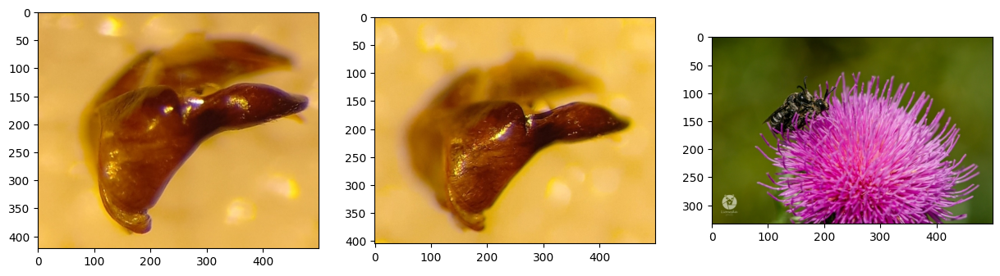

In [52]:
import hashlib
from pathlib import Path
import matplotlib.pyplot as plt

def get_hash(path):

    # resize image
    img = Image.open(path)
    img = img.resize((256,256))
    
    # hash image with sha256
    hash_ = hashlib.sha256(img.tobytes()).hexdigest()

    return hash_



                
def is_duplicate(hash_1, hash_2, cutoff):
    
    # convert hex to binary
    hash_1 = bin(int(hash_1, 16))
    hash_2 = bin(int(hash_2, 16))

    # remove '0b' from the beginning of the string
    hash_1 = hash_1[2:]
    hash_2 = hash_2[2:]

    # calculate hamming distance one liner
    hamming_distance = sum(xi != yi for xi, yi in zip(hash_1, hash_2))


    # check if hamming distance is below cutoff
    return True if hamming_distance < cutoff else False, hamming_distance




base_path = '../../data_bees_detection/test_duplicates/'
path_3 = os.path.join(base_path,'82888774.jpg')
path_2 = os.path.join(base_path,'218427586.jpeg')
path_1 = os.path.join(base_path,'218427596.jpeg')

cutoff = 80

hash_1 = get_hash(path_1)
hash_2 = get_hash(path_2)
hash_3 = get_hash(path_3)

print('hash_1 - hash_1 (same image): ', is_duplicate(hash_1, hash_1, cutoff))
print('hash_1 - hash_2: ', is_duplicate(hash_1, hash_2, cutoff))
print('hash_1 - hash_3: ', is_duplicate(hash_1, hash_3, cutoff))

# display images in a row
fig, axs = plt.subplots(1, 3, figsize=(15, 15))
axs[0].imshow(Image.open(path_1))
axs[1].imshow(Image.open(path_2))
axs[2].imshow(Image.open(path_3))



# set len

## Test sur tout un dossier hash 64 bits

In [79]:
def hash_picture(path):
    img = Image.open(path)
    img = img.resize((256,256))
    return imagehash.average_hash(img)

def is_duplicate(hash_1, hash_2, cutoff):
    return hash_1 - hash_2 < cutoff

def show_duplicates(img_to_test,base_path,cutoff):

    hash_1 = hash_picture(img_to_test)

    duplicates = []
    deltas = []
    for img in os.listdir(base_path):
        img = os.path.join(base_path,img)

        if img != img_to_test :
        
            hash_2 = hash_picture(img)
            if is_duplicate(hash_1, hash_2, cutoff):
                duplicates.append(img)
                deltas.append(hash_1 - hash_2)

    if len(duplicates) == 0:
        print('No duplicates found')
        return

    # display images in a row
    fig, axs = plt.subplots(1, len(duplicates)+1, figsize=(15, 15))
    axs[0].imshow(Image.open(img_to_test))
    for i in range(len(duplicates)):
        axs[i+1].imshow(Image.open(duplicates[i]))

    # set legends
    axs[0].set_title('Original')
    for i in range(len(duplicates)):
        axs[i+1].set_title('Duplicate '+str(i+1)+' - delta: '+str(deltas[i]))

    plt.show()

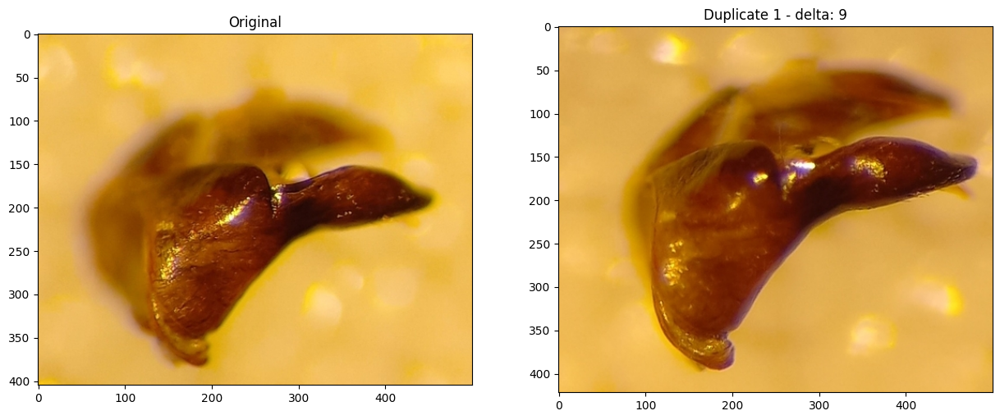

In [81]:
show_duplicates(path_2,base_path,10)

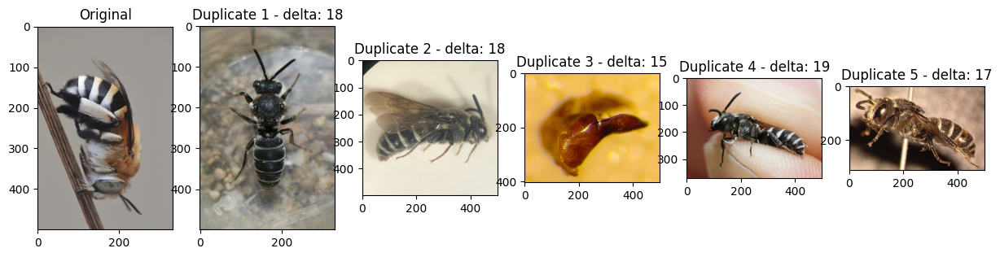

In [56]:
new_path = '../../data_bees_detection/whole_dataset/inaturalist_2305/Amegilla quadrifasciata'
img_to_test = os.path.join(new_path,'154583601.jpeg')

show_duplicates(img_to_test,base_path,20)

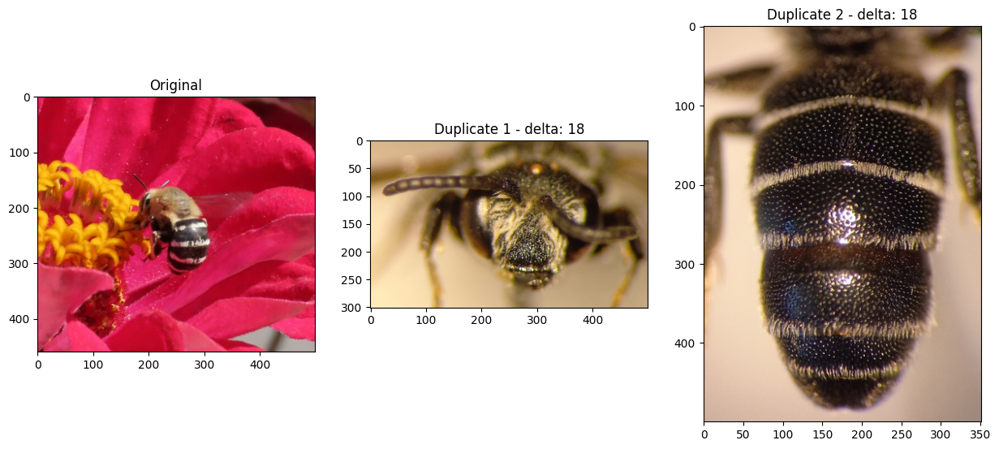

In [57]:
img_to_test = os.path.join(new_path,'238859032.jpg')

show_duplicates(img_to_test,base_path,20)

## Test sur tout un dossier hash SHA256

In [77]:
def get_hash(path):

    # resize image
    img = Image.open(path)
    img = img.resize((256,256))
    
    # hash image with sha256
    hash_ = hashlib.sha256(img.tobytes()).hexdigest()

    # convert hex to binary
    hash_ = bin(int(hash_, 16))[2:]


    return hash_

                
def is_duplicate(hash_1, hash_2, cutoff):
    
    
    # calculate hamming distance one liner
    hamming_distance = sum(xi != yi for xi, yi in zip(hash_1, hash_2))


    # check if hamming distance is below cutoff
    return True if hamming_distance < cutoff else False, hamming_distance


def show_duplicates(img_to_test,base_path,cutoff):

    hash_1 = get_hash(img_to_test)

    duplicates = []
    deltas = []
    for img in os.listdir(base_path):
        img = os.path.join(base_path,img)

        if img != img_to_test :
        
            hash_2 = get_hash(img)

            boolean,hamming_distance = is_duplicate(hash_1, hash_2, cutoff)

            if boolean:
                duplicates.append(img)
                deltas.append(hamming_distance)

    if len(duplicates) == 0:
        print('No duplicates found')
        return

    # display images in a row
    fig, axs = plt.subplots(1, len(duplicates)+1, figsize=(15, 15))
    axs[0].imshow(Image.open(img_to_test))
    for i in range(len(duplicates)):
        axs[i+1].imshow(Image.open(duplicates[i]))

    # set legends
    axs[0].set_title('Original')
    for i in range(len(duplicates)):
        axs[i+1].set_title('Duplicate '+str(i+1)+' - delta: '+str(deltas[i]))

    plt.show()

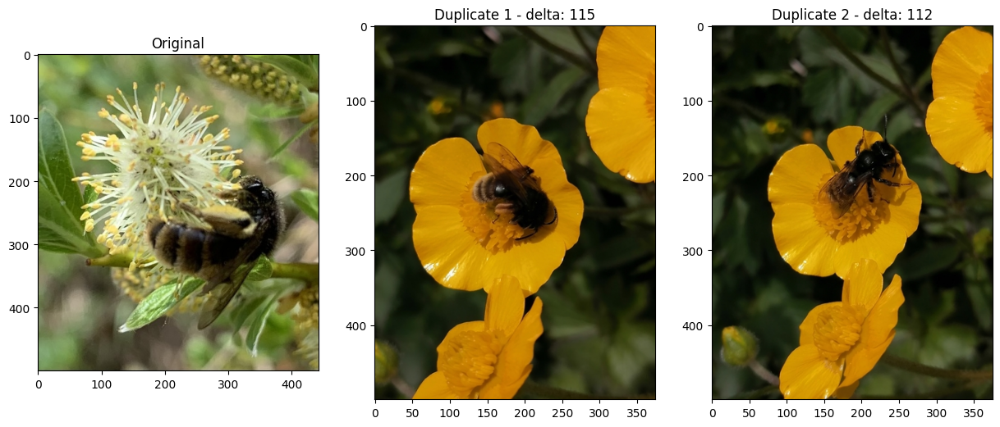

In [79]:
new_path = '../../data_bees_detection/whole_dataset/inaturalist_2305/Andrena rogenhoferi'
img_to_test = os.path.join(new_path,'204137786.jpg')

show_duplicates(img_to_test,new_path,120)

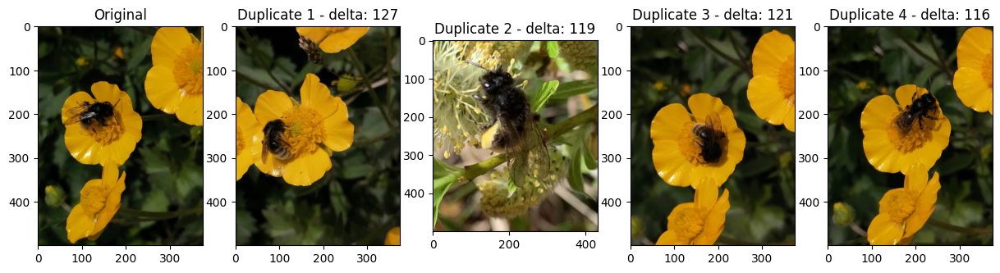

In [82]:
new_path = '../../data_bees_detection/whole_dataset/inaturalist_2305/Andrena rogenhoferi'
img_to_test = os.path.join(new_path,'204402306.jpeg')

show_duplicates(img_to_test,new_path,128)

**Conclusion : pas fou, si delta très bas c'est fiable, mais si delta élevé, c'est pas fiable**

On peut essayer d'autres hash, mais ça ne semble pas être la meilleure solution.

## Comparaison des performances des différents hash

On utilise les hash suivants :

* Average hash
* Perceptual hash
* Difference hash
* Wavelet hash
* Crop-resistant hash

In [94]:
def average_hash_func(img):
    img = Image.open(img)
    img = img.resize((256,256))
    return imagehash.average_hash(img)

def phash_func(img):
    img = Image.open(img)
    img = img.resize((256,256))
    return imagehash.phash(img)


def dhash_func(img):
    img = Image.open(img)
    img = img.resize((256,256))
    return imagehash.dhash(img)

def whash_func(img):
    img = Image.open(img)
    img = img.resize((256,256))
    return imagehash.whash(img)

hash_functions = [average_hash_func,phash_func,dhash_func,whash_func]



def show_duplicates(img_to_test,base_path,cutoff,hash_func):

    hash_1 = hash_func(img_to_test)

    duplicates = []
    deltas = []
    for img in os.listdir(base_path):
        img = os.path.join(base_path,img)

        if img != img_to_test :
        
            hash_2 = hash_picture(img)
            if is_duplicate(hash_1, hash_2, cutoff):
                duplicates.append(img)
                deltas.append(hash_1 - hash_2)

    if len(duplicates) == 0:
        print('No duplicates found')
        return

    # display images in a row
    fig, axs = plt.subplots(1, len(duplicates)+1, figsize=(15, 15))
    axs[0].imshow(Image.open(img_to_test))
    for i in range(len(duplicates)):
        axs[i+1].imshow(Image.open(duplicates[i]))

    # set legends
    axs[0].set_title('Original')
    for i in range(len(duplicates)):
        axs[i+1].set_title('Duplicate '+str(i+1)+' - delta: '+str(deltas[i]))

    plt.show()


def show_duplicates_hashes(img_to_test,base_path,cutoff,hash_functions):

    for hash_func in hash_functions:

        print('Hash function: ',hash_func.__name__)
        show_duplicates(img_to_test,base_path,cutoff,hash_func)
        print('\n')


Hash function:  average_hash_func


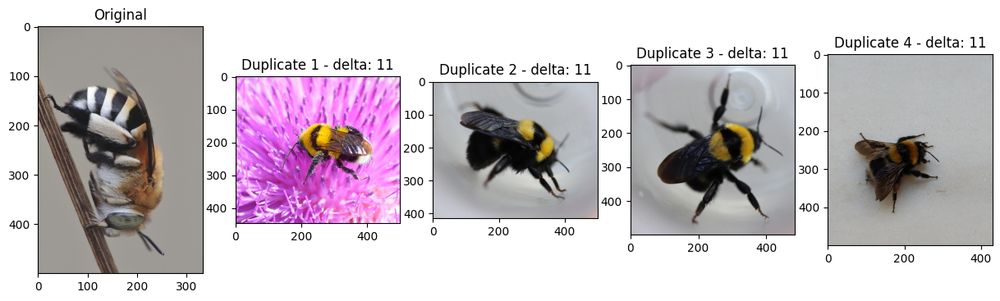



Hash function:  phash_func
No duplicates found


Hash function:  dhash_func
No duplicates found


Hash function:  whash_func


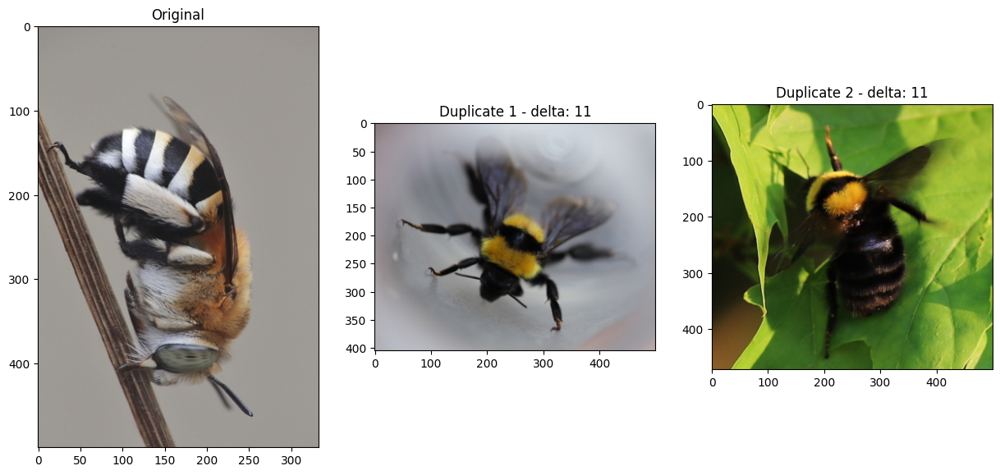

In [98]:
img_to_test = os.path.join(new_path,'154583601.jpeg')

show_duplicates_hashes(img_to_test,base_path,12,hash_functions)

Hash function:  average_hash_func


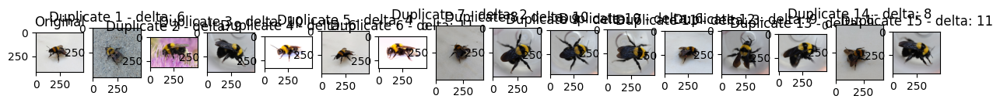



Hash function:  phash_func
No duplicates found


Hash function:  dhash_func
No duplicates found


Hash function:  whash_func


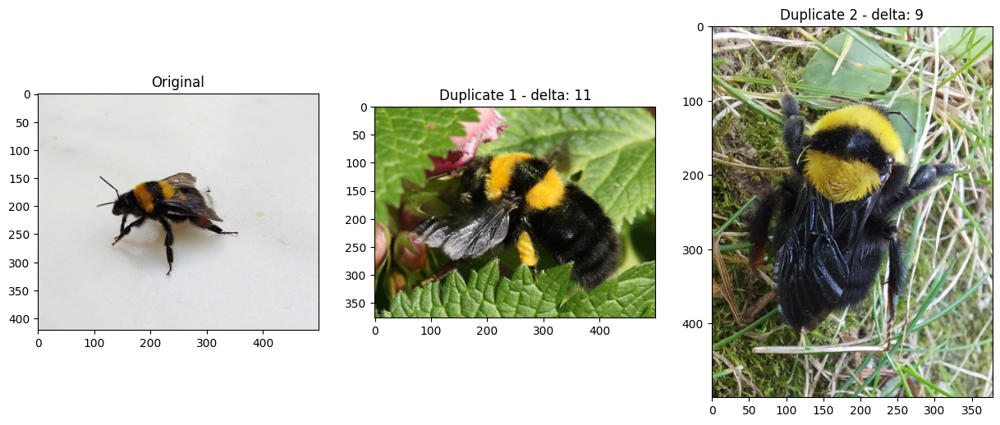

In [101]:
base_path = '../../data_bees_detection/whole_dataset/inaturalist_2305/Bombus argillaceus'
img_to_test = os.path.join(base_path,'39835704.jpg')

show_duplicates_hashes(img_to_test,base_path,12,hash_functions)

Hash function:  average_hash_func


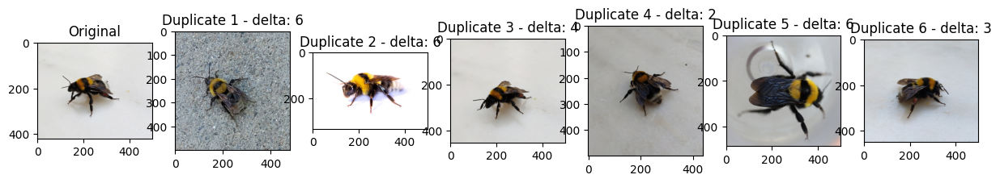



Hash function:  phash_func
No duplicates found


Hash function:  dhash_func
No duplicates found


Hash function:  whash_func
No duplicates found




In [104]:
base_path = '../../data_bees_detection/whole_dataset/inaturalist_2305/Bombus argillaceus'
img_to_test = os.path.join(base_path,'39835704.jpg')

show_duplicates_hashes(img_to_test,base_path,7,hash_functions)

Hash function:  average_hash_func


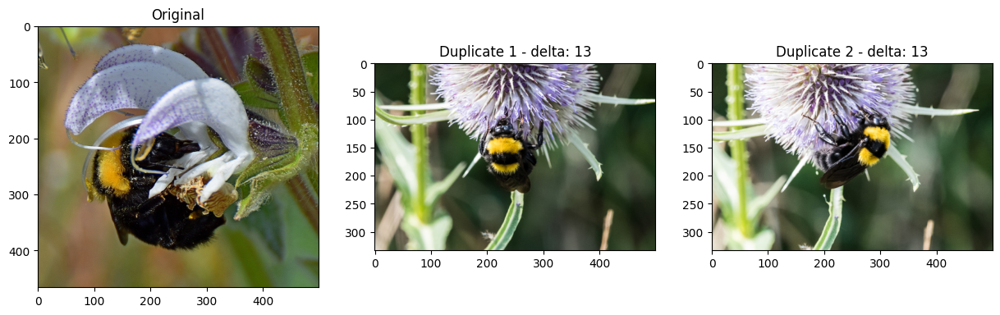



Hash function:  phash_func
No duplicates found


Hash function:  dhash_func
No duplicates found


Hash function:  whash_func


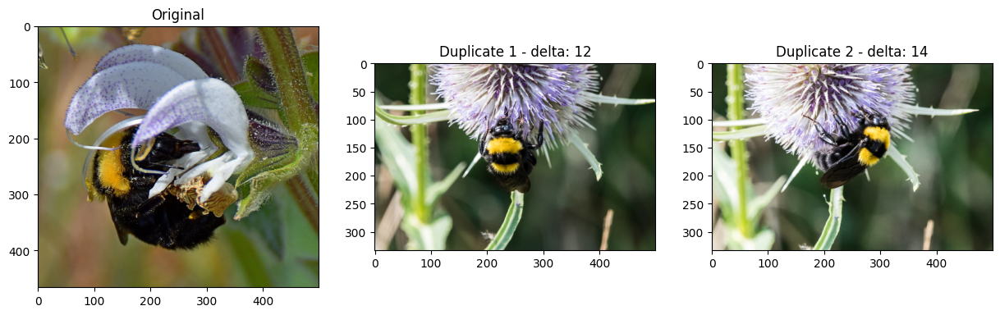

In [91]:
base_path = '../../data_bees_detection/whole_dataset/inaturalist_2305/Bombus argillaceus'
img_to_test = os.path.join(base_path,'10862488.jpeg')

show_duplicates_hashes(img_to_test,base_path,15,hash_functions)

**Conclusion :**

Quitte à utiliser du hash :

* average ou wavelet hash sont les plus fiables
* average hash est le plus rapide
* seuil de 10 le plus fiable

Mais ca reste pas fou, on va essayer autre chose

# 2. Filtrer les photos avec les métadonnées iNaturalist

## 2.1 Test : photo_uuid

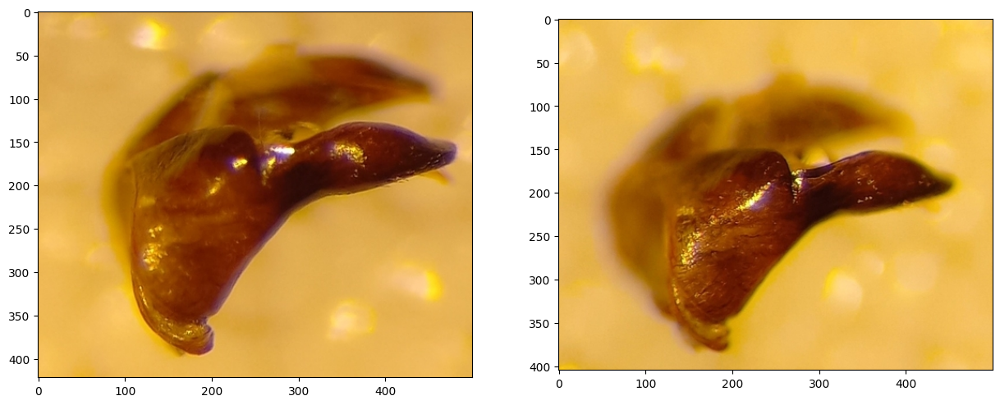

In [7]:
import os 
import matplotlib.pyplot as plt
from PIL import Image

base_path = '../../data_bees_detection/whole_dataset/inaturalist_2305/Aglaoapis tridentata'
img_1 = os.path.join(base_path,'218427596.jpeg')
img_2 = os.path.join(base_path,'218427586.jpeg')

# display images in a row
fig, axs = plt.subplots(1, 2, figsize=(15, 15))
axs[0].imshow(Image.open(img_1))
axs[1].imshow(Image.open(img_2))



**Requête pour vérifier les observations_uuid**

```
select observation_uuid
from inaturalist_2305_france i
where i.photo_id in (218427586,218427596);
```

**Résultat:**

* c97de0f6-4073-496a-ae28-4a02ef95ff24
* c97de0f6-4073-496a-ae28-4a02ef95ff24

On peut donc bien filtrer par ça.

**Néanmoins** 

```
SELECT photo_id
FROM inaturalist_2305_france inat
where inat.taxon_id = 987143
and inat.observation_uuid in (
 SELECT observation_uuid
    FROM inaturalist_2305_france
    GROUP BY observation_uuid
    HAVING COUNT(*) > 1
);
```


**Résultats :**

* 218427458	jpeg
* 218427484	jpeg
* 218427497	jpeg
* 218427510	jpeg
* 218427473	jpeg
* 218427519	jpeg
* 218427532	jpeg
* 218427543	jpeg
* 218427559	jpeg
* 218427571	jpeg
* 218427586	jpeg
* 218427596	jpeg
* 218427607	jpeg

**Et on a:**

Text(0.5, 1.0, 'Images Aglaopis Tridentada avec la même obseravtion_uuid')

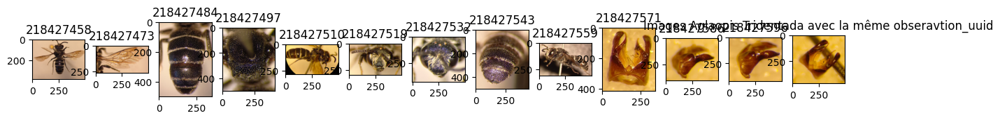

In [17]:
imgs_names = [218427458,
218427473,
218427484,
218427497,
218427510,
218427519,
218427532,
218427543,
218427559,
218427571,
218427586,
218427596,
218427607]

ext = '.jpeg'

imgs = [str(img) + ext for img in imgs_names ]

base_path = '../../data_bees_detection/whole_dataset/inaturalist_2305/Aglaoapis tridentata/'

imgs = [os.path.join(base_path,img) for img in imgs]

# display the images 

fig, axs = plt.subplots(1, len(imgs), figsize=(15, 15))
for i in range(len(imgs)):
    axs[i].imshow(Image.open(imgs[i]))
    axs[i].set_title(imgs_names[i])
plt.title('Images Aglaopis Tridentada avec la même obseravtion_uuid')

**Conclusion: c'est un bon début mais ce n'est pas suffisant**

On ne peut pas non plus discriminer par la géolocalisation car toutes sont localisées au même endroit.

Ni par la date.

# 3. Combinaison des deux approches
Ainsi on essaye de repérer les doublons en deux étapes : 

* même observations_uuid
* hash pas trop différents


Pour accélerer le process on va éditer un csv depuis la base de données.

## Dossier test

1. Récupérer les photos avec le même observations_uuid

In [143]:
import os
import sqlite3
import pandas as pd

# get the observation_uuid for each image
base_path = '../../data_bees_detection/test_duplicates/'

img_names = os.listdir(base_path)
imgs_names = [img.split('.')[0] for img in img_names]

sql_query = '''
SELECT p.photo_id,obs.observation_uuid,p.extension
FROM observations obs 
JOIN photos p ON obs.observation_uuid = p.observation_uuid
WHERE p.photo_id IN (''' + ','.join(imgs_names) + ''')
;'''

# create connection to the database
conn = sqlite3.connect('../../data_bees_detection/inat_utils/inat.db')

df = pd.read_sql_query(sql_query, conn)

# remove first row
df = df.iloc[1:]

df['taxon_name'] = 'Aglaoapis tridentata'

df.head()

df.to_csv('../../test.csv',index=False)



POur éviter de calculer des hash sur tous les fichiers, on va d'abord récupérer les photos avec le même observations_uuid et les même taxon_id.



In [85]:

# pour
def filter_duplicates_candidates(initial_df):

    # keep only the images with the same observation_uuid and taxon_name
    initial_df['concatenated'] = initial_df.apply(lambda x: str(x['observation_uuid']) + '/' + str(x['taxon_name']), axis=1)

    # remove the ones that have only one image
    initial_df = initial_df.groupby(['concatenated']).filter(lambda x: len(x) > 1)

    
    duplicate_candidates = initial_df


    return duplicate_candidates

duplicate_candidates = filter_duplicates_candidates(df)

duplicate_candidates.head()


,photo_id,observation_uuid,extension,taxon_name,concatenated
1,137268125,3d306f3e-1d97-41c0-8e5a-2f78eee1c77c,jpg,Aglaoapis tridentata,3d306f3e-1d97-41c0-8e5a-2f78eee1c77c/Aglaoapis...
2,137268162,3d306f3e-1d97-41c0-8e5a-2f78eee1c77c,jpg,Aglaoapis tridentata,3d306f3e-1d97-41c0-8e5a-2f78eee1c77c/Aglaoapis...
3,137268195,3d306f3e-1d97-41c0-8e5a-2f78eee1c77c,jpg,Aglaoapis tridentata,3d306f3e-1d97-41c0-8e5a-2f78eee1c77c/Aglaoapis...
4,198166757,a4bd0c4d-6199-4732-8a41-bcf7c651c910,jpg,Aglaoapis tridentata,a4bd0c4d-6199-4732-8a41-bcf7c651c910/Aglaoapis...
5,198166775,a4bd0c4d-6199-4732-8a41-bcf7c651c910,jpg,Aglaoapis tridentata,a4bd0c4d-6199-4732-8a41-bcf7c651c910/Aglaoapis...


## hash 64 bit (average)

In [134]:
import imagehash
from PIL import Image
import itertools

def hash_picture(path):
    img = Image.open(path)
    img = img.resize((256,256))
    return imagehash.average_hash(img)

def is_duplicate(hash_1, hash_2, cutoff):
    return hash_1 - hash_2 < cutoff, hash_1 - hash_2

def filter_duplicates_candidates(initial_df):

    # keep only the images with the same observation_uuid and taxon_name
    initial_df['concatenated'] = initial_df.apply(lambda x: str(x['observation_uuid']) + '/' + str(x['taxon_name']), axis=1)

    # remove the ones that have only one image
    initial_df = initial_df.groupby(['concatenated']).filter(lambda x: len(x) > 1)

    
    duplicate_candidates = initial_df


    return duplicate_candidates


def compare_every_file_in_folder(df,base_path):

    df = filter_duplicates_candidates(df)   

    # get image paths
    df['img_path'] = base_path + df['photo_id'].astype(str) + '.' + df['extension'].astype(str)

    # hash image
    df['ahash'] = df['img_path'].apply(hash_picture)


    duplicates = {}
    for concat in df['concatenated']:
        # get all the images with the same observation_uuid and taxon_name
        df_ = df[df['concatenated'] == concat][['img_path','ahash']]

        # compare every image with every other image
        for img_1, img_2 in itertools.combinations(df_['img_path'], 2):

            # get the hashes
            hash_1 = df_[df_['img_path'] == img_1]['ahash'].values[0]
            hash_2 = df_[df_['img_path'] == img_2]['ahash'].values[0]

            # check if they are duplicates
            boolean, hamming_distance = is_duplicate(hash_1, hash_2, 10)

            if boolean:
                # add the pair to the dictionary
                if concat not in duplicates:
                    duplicates[concat] = set()

                duplicates[concat].add((img_1, img_2, hamming_distance))


    return duplicates

def display_duplicates(df,base_path):

    duplicates = filter_duplicates_candidates(df)

    for concat in duplicates:
        print('concat: ',concat)
        print('Number of duplicates: ',len(duplicates[concat]))
        print('\n')
        

        for i, pair in enumerate(duplicates[concat]):

            # display images in a row
            fig, axs = plt.subplots(1, 2, figsize=(15, 15))
            axs[0].imshow(Image.open(pair[0]))
            axs[1].imshow(Image.open(pair[1]))

            # set legends
            axs[0].set_title('Original')
            axs[1].set_title('Duplicate '+str(i+1)+' - delta: '+str(pair[2]))
            

        plt.show()

                

In [ ]:
duplicates = compare_every_file_in_folder(df,base_path)

display_duplicates(duplicates,base_path)

In [ ]:
base_path = '../../data_bees_detection/test_duplicates/'

duplicates = compare_every_file_in_folder(df,base_path)

display_duplicates(duplicates,base_path)

 

## hash 256

In [144]:
import hashlib
from PIL import Image
import itertools

def get_hash(path):

    # resize image
    img = Image.open(path)
    img = img.resize((256,256))
    
    # hash image with sha256
    hash_ = hashlib.sha256(img.tobytes()).hexdigest()

    # convert hex to binary
    hash_ = bin(int(hash_, 16))[2:]


    return hash_

                
def is_duplicate(hash_1, hash_2, cutoff):
    # calculate hamming distance one liner
    hamming_distance = sum(xi != yi for xi, yi in zip(str(hash_1),str(hash_2)))

    # check if hamming distance is below cutoff
    return True if hamming_distance < cutoff else False, hamming_distance

def filter_duplicates_candidates(initial_df):

    # keep only the images with the same observation_uuid and taxon_name
    initial_df['concatenated'] = initial_df.apply(lambda x: str(x['observation_uuid']) + '/' + str(x['taxon_name']), axis=1)

    # remove the ones that have only one image
    initial_df = initial_df.groupby(['concatenated']).filter(lambda x: len(x) > 1)

    
    duplicate_candidates = initial_df


    return duplicate_candidates


def compare_every_file_in_folder(df,base_path):

    df = filter_duplicates_candidates(df)   

    # get image paths
    df['img_path'] = base_path + df['photo_id'].astype(str) + '.' + df['extension'].astype(str)

    # hash image
    df['ahash'] = df['img_path'].apply(hash_picture)


    duplicates = {}
    for concat in df['concatenated']:
        # get all the images with the same observation_uuid and taxon_name
        df_ = df[df['concatenated'] == concat][['img_path','ahash']]

        # compare every image with every other image
        for img_1, img_2 in itertools.combinations(df_['img_path'], 2):

            # get the hashes
            hash_1 = df_[df_['img_path'] == img_1]['ahash'].values[0]
            hash_2 = df_[df_['img_path'] == img_2]['ahash'].values[0]

            # check if they are duplicates
            boolean, hamming_distance = is_duplicate(hash_1, hash_2, 10)

            if boolean:
                # add the pair to the dictionary
                if concat not in duplicates:
                    duplicates[concat] = set()

                duplicates[concat].add((img_1, img_2, hamming_distance))


    return duplicates

def display_duplicates(duplicates,base_path):

    for concat in duplicates:
        print('concat: ',concat)
        print('Number of duplicates: ',len(duplicates[concat]))
        print('\n')
        

        for i, pair in enumerate(duplicates[concat]):

            # display images in a row
            fig, axs = plt.subplots(1, 2, figsize=(15, 15))
            axs[0].imshow(Image.open(pair[0]))
            axs[1].imshow(Image.open(pair[1]))

            # set legends
            axs[0].set_title('Original')
            axs[1].set_title('Duplicate '+str(i+1)+' - delta: '+str(pair[2]))
            

        plt.show()

                

concat:  3d306f3e-1d97-41c0-8e5a-2f78eee1c77c/Aglaoapis tridentata
Number of duplicates:  2




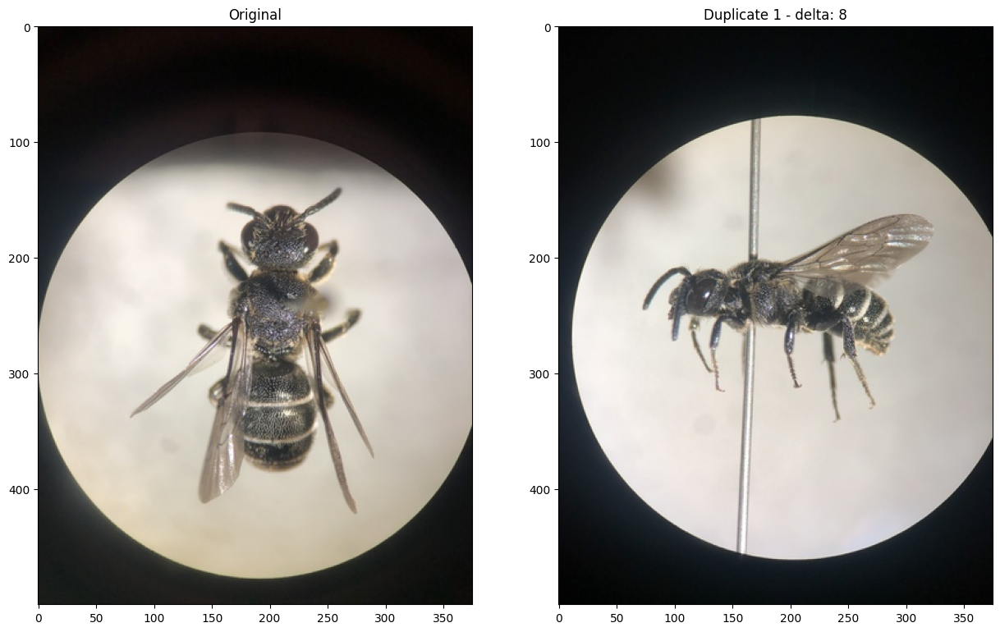

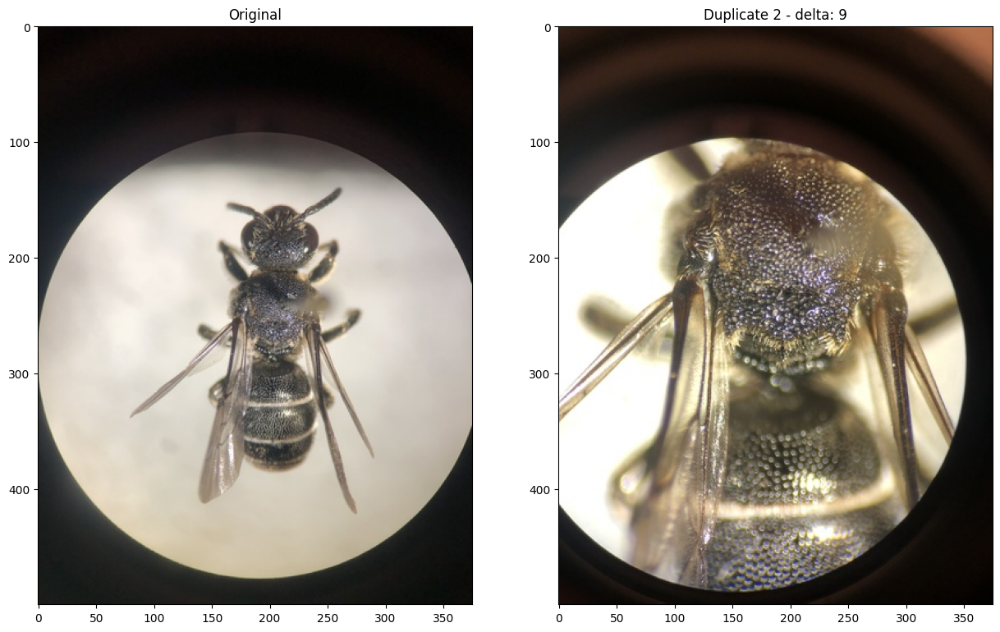

concat:  a4bd0c4d-6199-4732-8a41-bcf7c651c910/Aglaoapis tridentata
Number of duplicates:  1




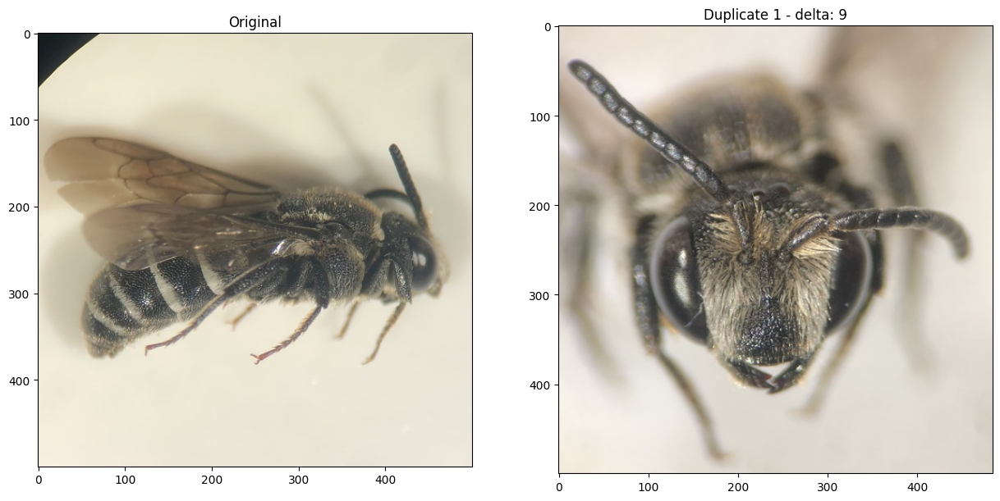

concat:  cf56298d-a17d-49dd-9a47-d129f0dc5bcc/Aglaoapis tridentata
Number of duplicates:  2




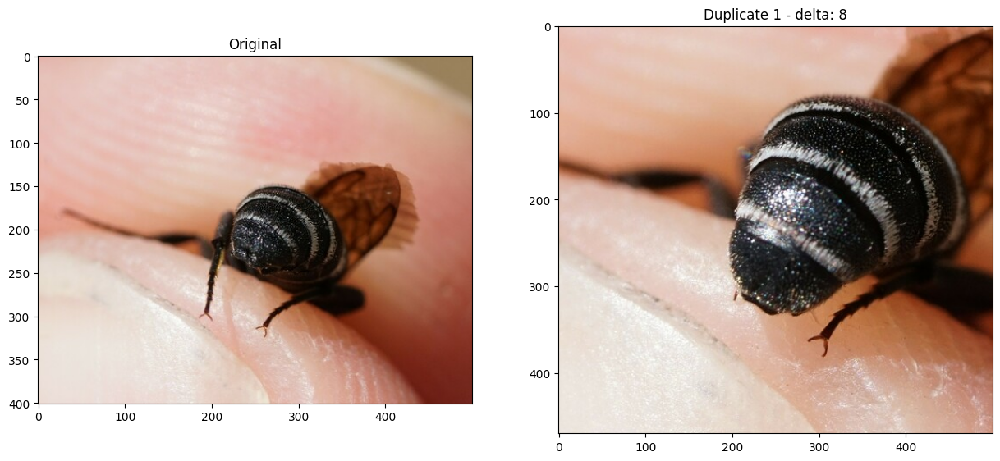

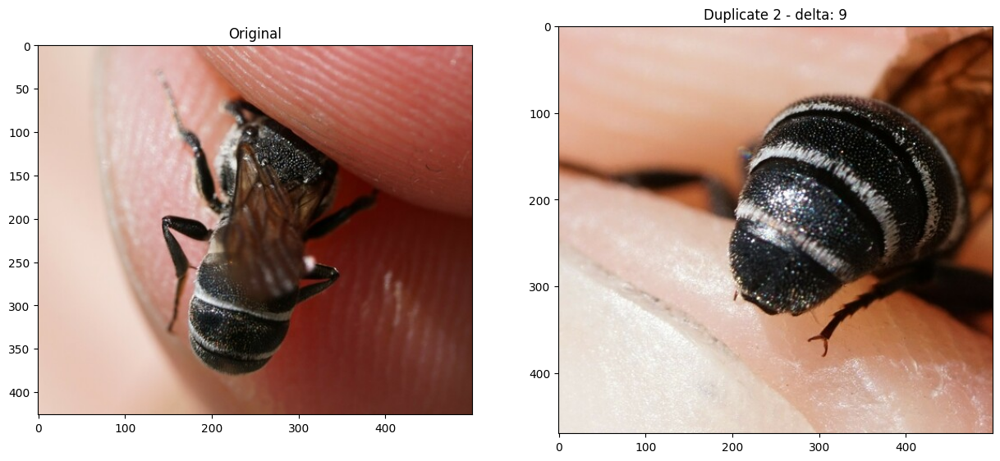

concat:  c97de0f6-4073-496a-ae28-4a02ef95ff24/Aglaoapis tridentata
Number of duplicates:  3




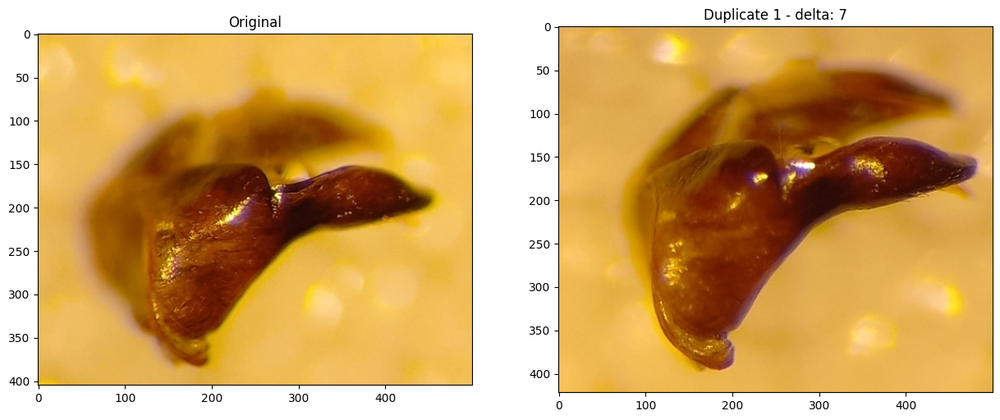

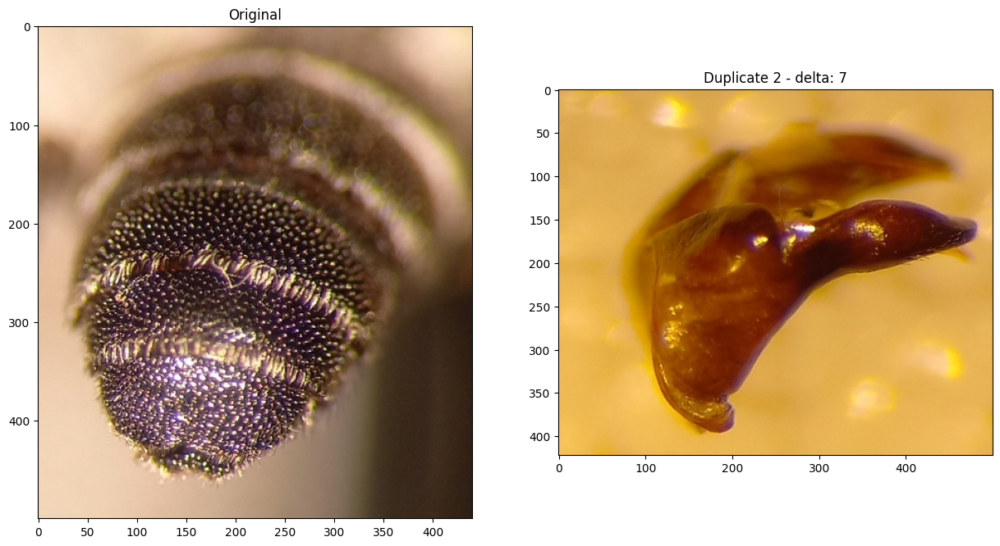

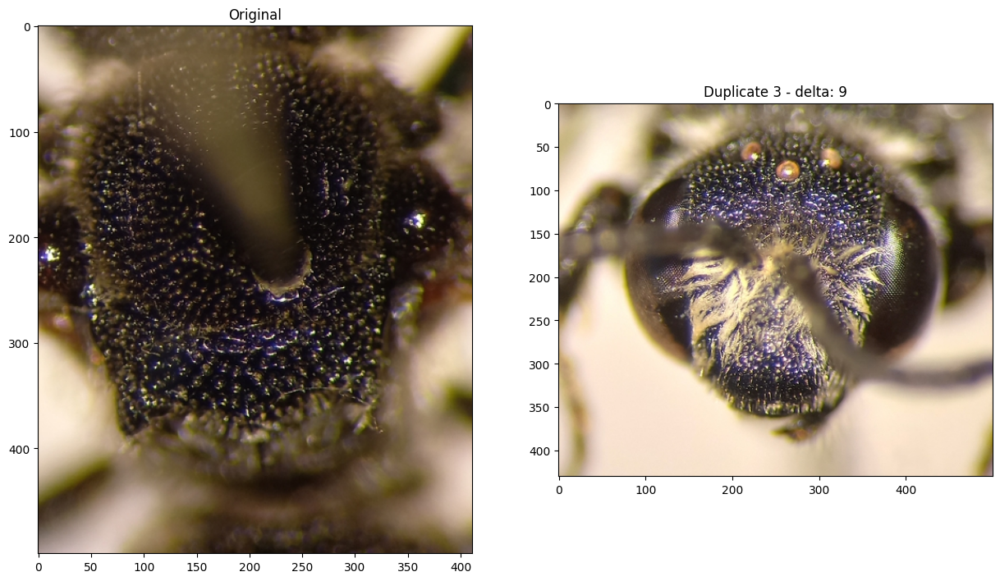

In [145]:
base_path = '../../data_bees_detection/test_duplicates/'

duplicates = compare_every_file_in_folder(df,base_path)

display_duplicates(duplicates,base_path)

## Test sur un plus gros dossier

In [25]:
import os
import sqlite3
import pandas as pd

# get the observation_uuid for each image
base_path = '../../data_bees_detection/whole_dataset/inaturalist_2305/Bombus vestalis/'

img_names = os.listdir(base_path)
imgs_names = [img.split('.')[0] for img in img_names]

sql_query = '''
SELECT p.photo_id,obs.observation_uuid,p.extension
FROM observations obs 
JOIN photos p ON obs.observation_uuid = p.observation_uuid
WHERE p.photo_id IN (''' + ','.join(imgs_names) + ''')
;'''

# create connection to the database
conn = sqlite3.connect('../../data_bees_detection/inat_utils/inat.db')

df = pd.read_sql_query(sql_query, conn)

# remove first row
df = df.iloc[1:]

df['taxon_name'] = 'Bombus vestalis'

df.head()

,photo_id,observation_uuid,extension,taxon_name
1,3993241,2e95d174-97a0-447e-ac23-6a22e849de9d,jpg,Bombus vestalis
2,6596565,b9736e76-733b-410c-8eb6-d0453894f36b,jpg,Bombus vestalis
3,6596693,b9736e76-733b-410c-8eb6-d0453894f36b,jpg,Bombus vestalis
4,6596694,b9736e76-733b-410c-8eb6-d0453894f36b,jpg,Bombus vestalis
5,7795952,d3059197-55d8-457e-8b6f-40ef933cce9c,jpg,Bombus vestalis


In [41]:
import hashlib
from PIL import Image
import itertools
from matplotlib import pyplot as plt

def get_hash(path):

    # resize image
    img = Image.open(path)
    img = img.resize((256,256))
    
    # hash image with sha256
    hash_ = hashlib.sha256(img.tobytes()).hexdigest()

    # convert hex to binary
    hash_ = bin(int(hash_, 16))[2:]

    return hash_

                
def is_duplicate(hash_1, hash_2, cutoff):
    # calculate hamming distance one liner
    hamming_distance = sum(xi != yi for xi, yi in zip(str(hash_1),str(hash_2)))

    # check if hamming distance is below cutoff
    return True if hamming_distance < cutoff else False, hamming_distance

def filter_duplicates_candidates(initial_df):

    # keep only the images with the same observation_uuid and taxon_name
    initial_df['concatenated'] = initial_df.apply(lambda x: str(x['observation_uuid']) + '/' + str(x['taxon_name']), axis=1)

    # remove the ones that have only one image
    initial_df = initial_df.groupby(['concatenated']).filter(lambda x: len(x) > 1)

    
    duplicate_candidates = initial_df


    return duplicate_candidates


def compare_every_file_in_folder(df,base_path):

    df = filter_duplicates_candidates(df)   

    # get image paths
    df['img_path'] = base_path + df['photo_id'].astype(str) + '.' + df['extension'].astype(str)

    # hash image
    df['ahash'] = df['img_path'].apply(get_hash)


    duplicates = {}
    for concat in df['concatenated']:
        # get all the images with the same observation_uuid and taxon_name
        df_ = df[df['concatenated'] == concat][['img_path','ahash']]

        # compare every image with every other image
        for img_1, img_2 in itertools.combinations(df_['img_path'], 2):

            # get the hashes
            hash_1 = df_[df_['img_path'] == img_1]['ahash'].values[0]
            hash_2 = df_[df_['img_path'] == img_2]['ahash'].values[0]

            # check if they are duplicates
            boolean, hamming_distance = is_duplicate(hash_1, hash_2, 10)

            if boolean:
                # add the pair to the dictionary
                if concat not in duplicates:
                    duplicates[concat] = set()

                duplicates[concat].add((img_1, img_2, hamming_distance))


    return duplicates

def display_duplicates(duplicates,base_path):


    for concat in duplicates:
        print('concat: ',concat)
        print('Number of duplicates: ',len(duplicates[concat]))
        print('\n')
        

        for i, pair in enumerate(duplicates[concat]):

            # display images in a row
            fig, axs = plt.subplots(1, 2, figsize=(15, 15))
            axs[0].imshow(Image.open(pair[0]))
            axs[1].imshow(Image.open(pair[1]))

            # get names 
            name_1 = pair[0].split('/')[-1]
            name_2 = pair[1].split('/')[-1]

            axs[0].set_title('Original: '+name_1)
            axs[1].set_title('Duplicate: '+name_2 +str(i+1)+' - delta: '+str(pair[2]))
            

        plt.show()

                

concat:  ec04dc7d-9fa8-4249-afbc-560613f3de59/Bombus vestalis
Number of duplicates:  4




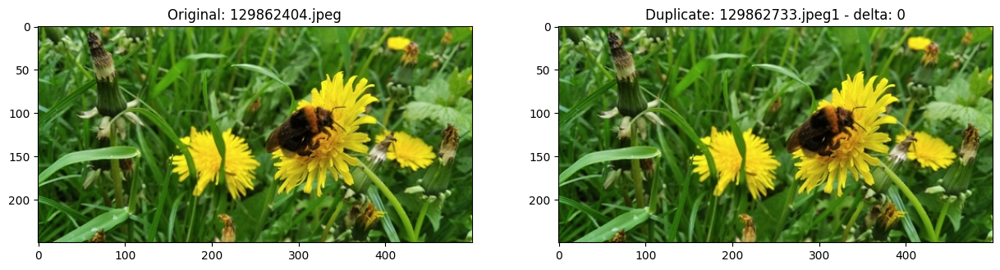

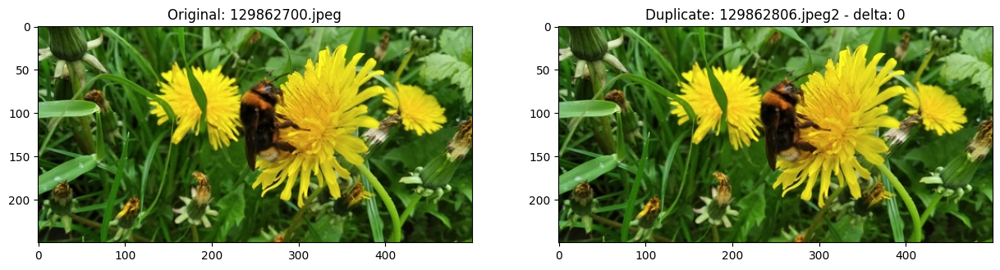

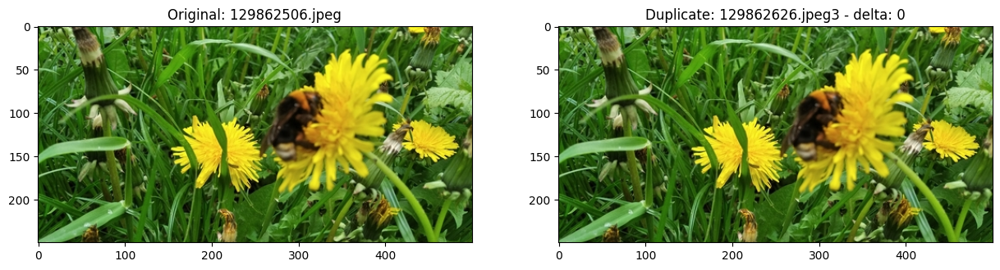

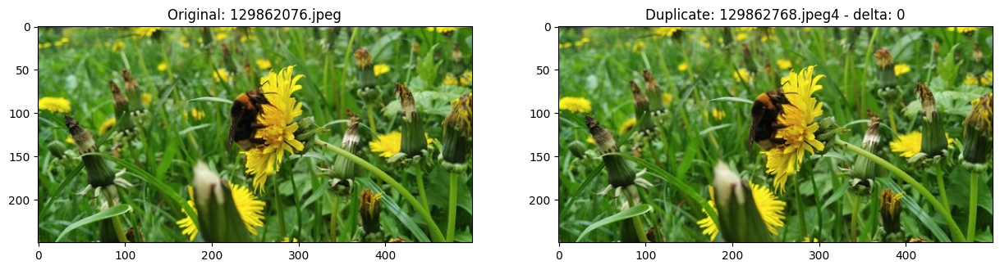

concat:  79b92e08-dae1-4dfb-a08a-de37c1025ed9/Bombus vestalis
Number of duplicates:  1




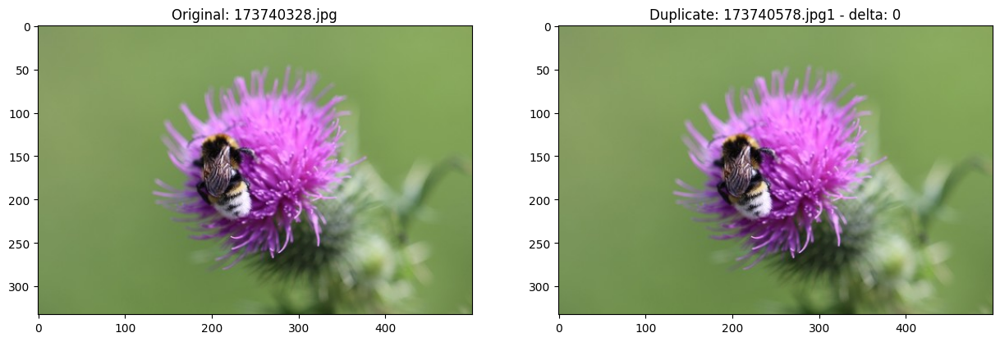

concat:  2335d610-eb94-4684-8a2d-b262d0a8511f/Bombus vestalis
Number of duplicates:  1




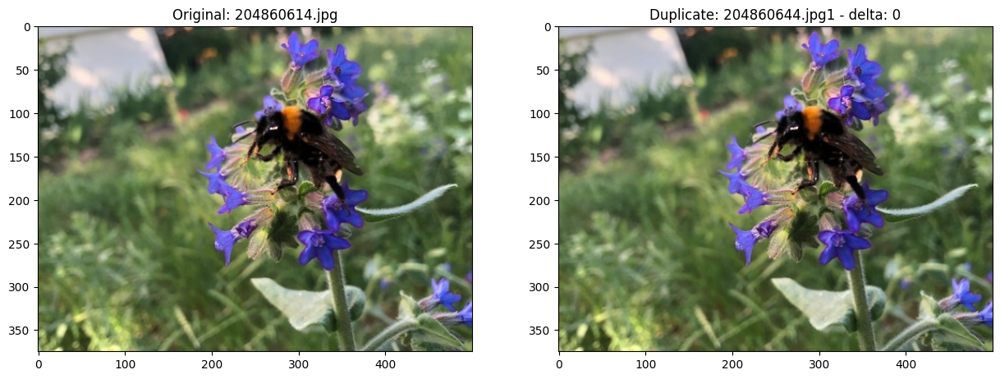

concat:  9adc2513-68e7-4e6b-8d93-a87572145eb4/Bombus vestalis
Number of duplicates:  1




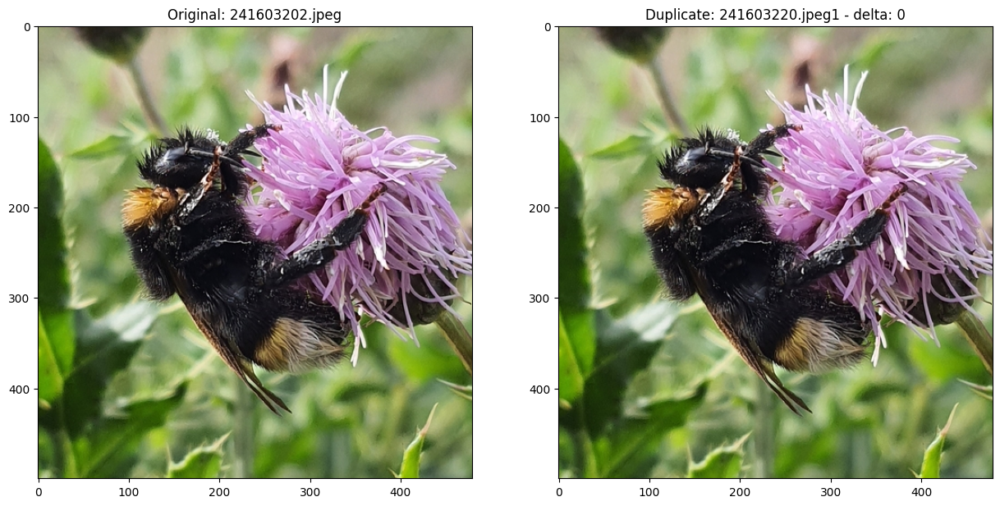

In [42]:
duplicates = compare_every_file_in_folder(df,base_path)

#filter duplicates to keep only 10 lowest hamming distance
for concat in duplicates:
    duplicates[concat] = sorted(duplicates[concat], key=lambda x: x[2])[:10]

display_duplicates(duplicates,base_path)

# Ca marche ... bien 




Exemple de photos détectées : 


**Résultats :**

* 129862076 , jpeg 
* 129862404 , jpeg
* 129862506 , jpeg
* 129862626 , jpeg
* 129862700 , jpeg
* 129862733 , jpeg
* 129862768 , jpeg
* 129862806 , jpeg

NameError: name 'Image' is not defined

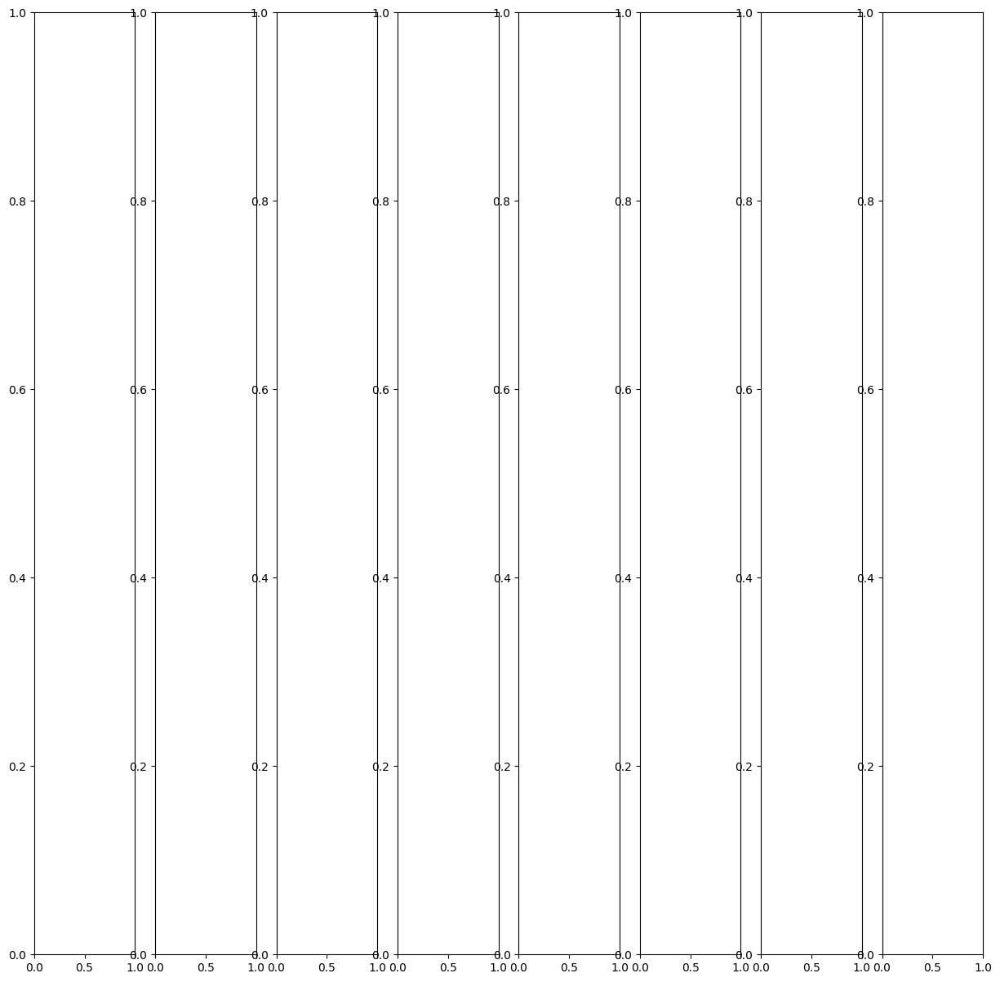

In [1]:
from matplotlib import pyplot as plt

photo_ids = [129862076,
129862404,
129862506,
129862626,
129862700,
129862733,
129862768,
129862806]

base_path = '../../data_bees_detection/whole_dataset/inaturalist_2305/Bombus vestalis/'

photo_paths = [base_path+str(photo_id)+'.jpeg' for photo_id in photo_ids]

# display images two by two
fig, axs = plt.subplots(1, len(photo_paths), figsize=(15, 15))

for i in range(len(photo_paths)):
    axs[i].imshow(Image.open(photo_paths[i]))

    


# **Conclusion :**

A comparer avec une méthode de deep learning.

**utiliser un autre hash ?**

* [deep hashing](https://pub.towardsai.net/deep-hashing-for-similarity-search-9273aac054db)